Soal 2: Noise Reduction dengan Filtering

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import soundfile as sf
from IPython.display import Audio, HTML, display
import os
import matplotlib
from scipy.signal import butter, filtfilt, spectrogram
from IPython.display import Audio, display
from pydub import AudioSegment

%matplotlib inline

print("Library versions:")
print(f"NumPy: {np.__version__}")
print(f"Matplotlib: {matplotlib.__version__}")
print(f"Librosa: {librosa.__version__}")



Library versions:
NumPy: 2.2.6
Matplotlib: 3.10.5
Librosa: 0.11.0


c:\Multimedia\Handson-audio\Soal2
Sample rate (frekuensi sampling): 48000 Hz
Durasi audio: 12.19 detik


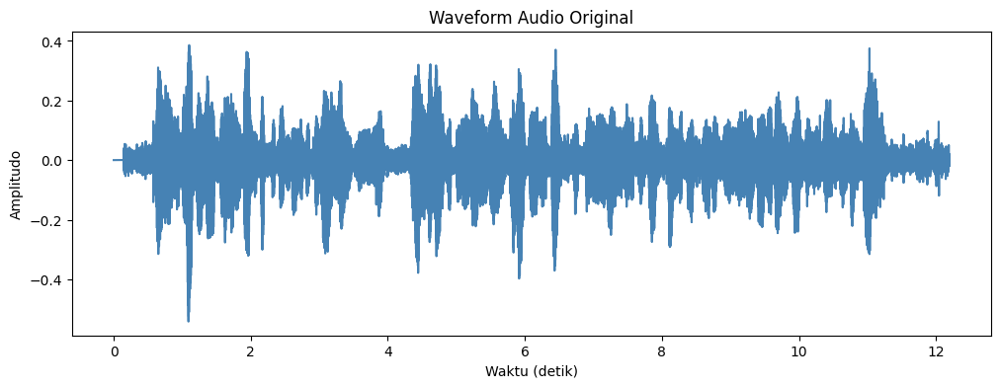

In [16]:
import os
print(os.getcwd())

# === Load file audio ===
file_path = os.path.join("..", "Data", "Audio2.wav")
y, sr = librosa.load(file_path, sr=None)

# === Tampilkan info dasar ===
print(f"Sample rate (frekuensi sampling): {sr} Hz")
print(f"Durasi audio: {len(y)/sr:.2f} detik")

# === Plot waveform ===
plt.figure(figsize=(12, 4))
plt.plot(np.linspace(0, len(y)/sr, len(y)), y, color='steelblue')
plt.title("Waveform Audio Original")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()

# === Dengarkan audio ===
Audio("../Data/Audio2.wav")

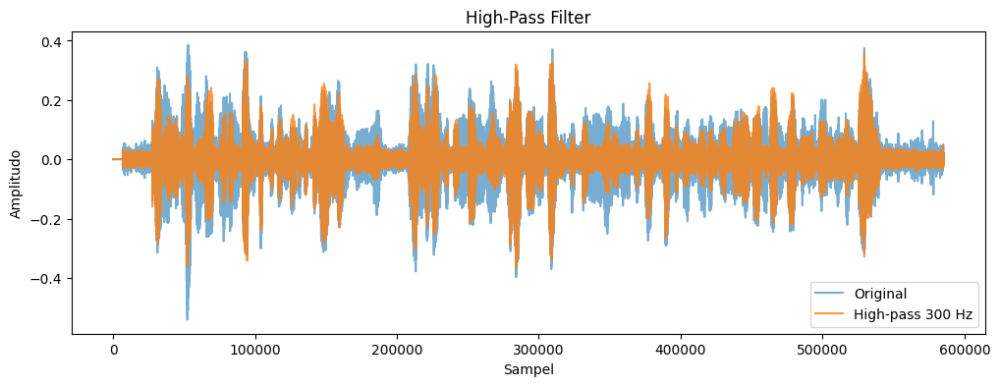

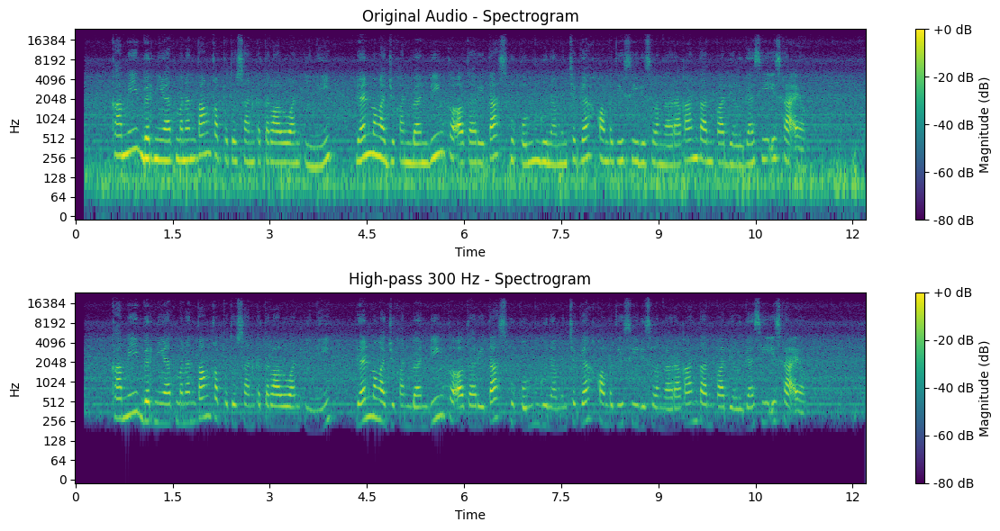

In [17]:
# === Load audio ===
audio_path = "../Data/Audio2.wav"
y, sr = librosa.load(audio_path, sr=None)

# === Fungsi high-pass filter ===
def highpass_filter(data, cutoff, fs, order=6):
    nyq = 0.5 * fs  # frekuensi Nyquist
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return filtfilt(b, a, data)

# === Terapkan filter ===
cutoff = 300  # contoh cutoff 300 Hz
y_hpf = highpass_filter(y, cutoff, sr)

# === Simpan hasil ===
sf.write("Audio2_highpass.wav", y_hpf, sr)

# === Plot hasil ===
plt.figure(figsize=(12, 4))
plt.plot(y, label="Original", alpha=0.6)
plt.plot(y_hpf, label=f"High-pass {cutoff} Hz", alpha=0.8)
plt.legend()
plt.title("High-Pass Filter")
plt.xlabel("Sampel")
plt.ylabel("Amplitudo")
plt.show()

# === Hitung spektrogram ===
D_original = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
D_hpf = librosa.amplitude_to_db(np.abs(librosa.stft(y_hpf)), ref=np.max)

# === Visualisasi spektrogram berdampingan ===
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
librosa.display.specshow(D_original, sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title("Original Audio - Spectrogram")
plt.colorbar(format='%+2.0f dB', label='Magnitude (dB)')

plt.subplot(2, 1, 2)
librosa.display.specshow(D_hpf, sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f"High-pass {cutoff} Hz - Spectrogram")
plt.colorbar(format='%+2.0f dB', label='Magnitude (dB)')

plt.tight_layout()
plt.show()


Audio("Audio2_highpass.wav")

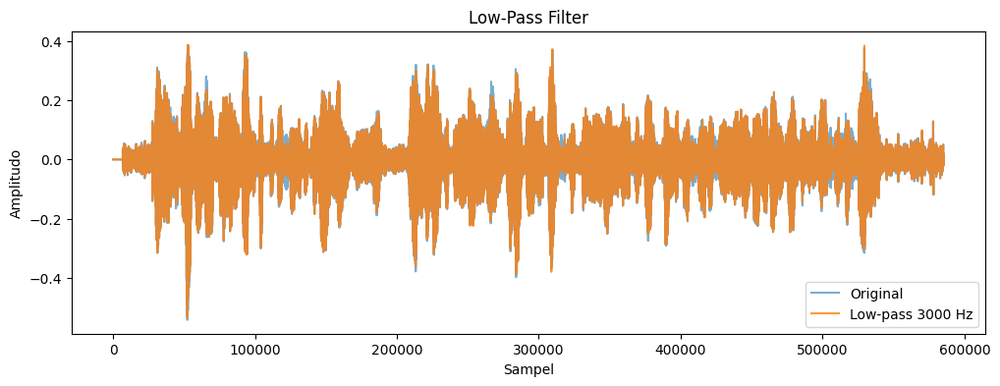

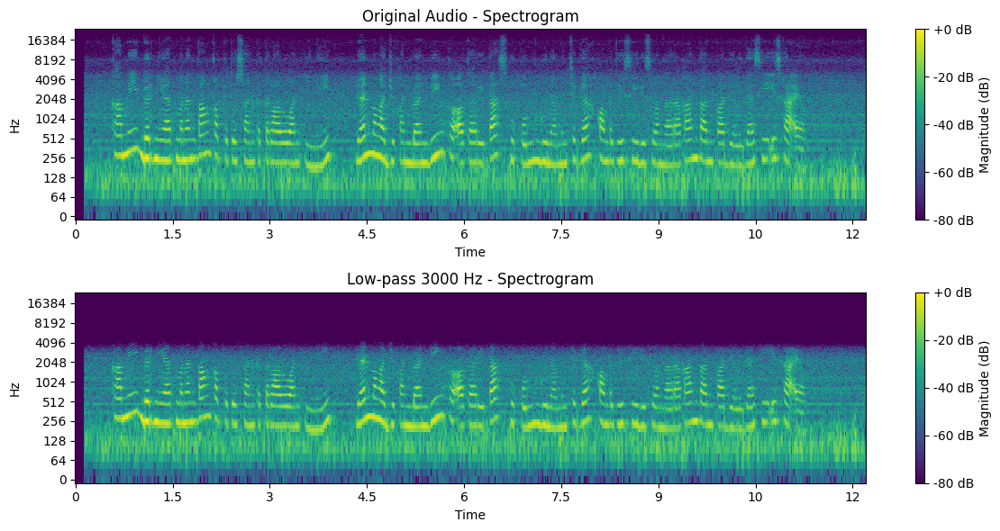

In [18]:
# === Load audio ===
y, sr = librosa.load("../Data/Audio2.wav", sr=None)

# === Fungsi low-pass filter ===
def lowpass_filter(data, cutoff, fs, order=6):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return filtfilt(b, a, data)

# === Terapkan filter ===
cutoff = 3000
y_lpf = lowpass_filter(y, cutoff, sr)

# === Simpan hasil ===
sf.write("Audio2_lowpass.wav", y_lpf, sr)

# === Plot hasil ===
plt.figure(figsize=(12, 4))
plt.plot(y, label="Original", alpha=0.6)
plt.plot(y_lpf, label=f"Low-pass {cutoff} Hz", alpha=0.8)
plt.legend()
plt.title("Low-Pass Filter")
plt.xlabel("Sampel")
plt.ylabel("Amplitudo")
plt.show()

# === Hitung spektrogram ===
D_original = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
D_lpf = librosa.amplitude_to_db(np.abs(librosa.stft(y_lpf)), ref=np.max)

# === Visualisasi spektrogram berdampingan ===
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
librosa.display.specshow(D_original, sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title("Original Audio - Spectrogram")
plt.colorbar(format='%+2.0f dB', label='Magnitude (dB)')

plt.subplot(2, 1, 2)
librosa.display.specshow(D_lpf, sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f"Low-pass {cutoff} Hz - Spectrogram")
plt.colorbar(format='%+2.0f dB', label='Magnitude (dB)')

plt.tight_layout()
plt.show()


# === Dengarkan hasilnya ===
Audio("Audio2_lowpass.wav")

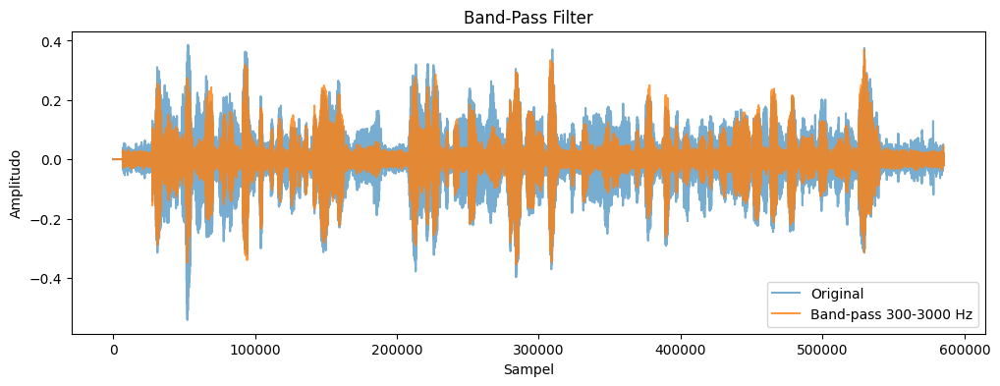

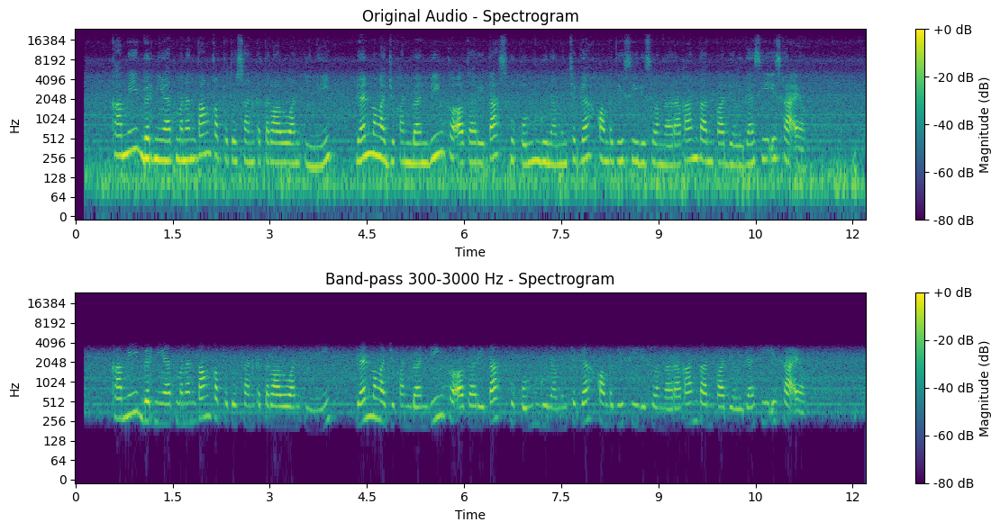

In [19]:
# === Load audio ===
y, sr = librosa.load("../Data/Audio2.wav", sr=None)

# === Fungsi band-pass filter ===
def bandpass_filter(data, lowcut, highcut, fs, order=6):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band', analog=False)
    return filtfilt(b, a, data)

# === Terapkan filter ===
lowcut = 300
highcut = 3000
y_bpf = bandpass_filter(y, lowcut, highcut, sr)

# === Simpan hasil ===
sf.write("Audio2_bandpass.wav", y_bpf, sr)

# === Plot hasil ===
plt.figure(figsize=(12, 4))
plt.plot(y, label="Original", alpha=0.6)
plt.plot(y_bpf, label=f"Band-pass {lowcut}-{highcut} Hz", alpha=0.8)
plt.legend()
plt.title("Band-Pass Filter")
plt.xlabel("Sampel")
plt.ylabel("Amplitudo")
plt.show()

# === Hitung spektrogram ===
D_original = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
D_bpf = librosa.amplitude_to_db(np.abs(librosa.stft(y_bpf)), ref=np.max)

# === Visualisasi spektrogram berdampingan ===
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
librosa.display.specshow(D_original, sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title("Original Audio - Spectrogram")
plt.colorbar(format='%+2.0f dB', label='Magnitude (dB)')

plt.subplot(2, 1, 2)
librosa.display.specshow(D_bpf, sr=sr, x_axis='time', y_axis='log', cmap='viridis')
plt.title(f"Band-pass {lowcut}-{highcut} Hz - Spectrogram")
plt.colorbar(format='%+2.0f dB', label='Magnitude (dB)')

plt.tight_layout()
plt.show()

# === Dengarkan hasilnya ===
Audio("Audio2_bandpass.wav")

Jelaskan:
1. Jenis noise yang muncul pada rekaman anda
2. Filter mana yang paling efektif untuk mengurangi noise tersebut
3. Nilai cutoff yang memberikan hasil terbaik
4. Bagaimana kualitas suara (kejelasan ucapan) setelah proses filtering

Jawab:
1. Noise yang muncul pada rekaman saya yaitu suara kipas angin yang kencang, disitu saya merekam sangat dekat dengan kipas angin sehingga mengeluarkan suara "tnggggggg".
2. menurut saya filter high pass yang paling efektif diantara low pass dan band pass. karena menurut saya di ketiga filter tersebut noisenya masih sama sama terdengar. namun ketika di high pass, suara saya terdengar lebih nyaring sehingga sangat kontras dengan suara noisenya. ketika di low pass itu noisenya sangat berkurang menurut saya, tapi suara saya juga jadi besar dan agak dengung/mendep sedikit, jadi sangat kurang efektif jika menggunakan filter low pass. dan untuk band pass dia juga cukup jelas untuk suara saya, tapi seperti seimbang dengan noise, jadi mirip suara di radio jaman dahulu, dan sedikit kurang menurut saya.
3. untuk nilai cutoff terbaik ada pada 300 Hz dengan filter high pass
4. kualitas suara/kejelasan ucapan saya menjadi bervariasi. pada filter highpass suara saya sangat jelas, ketika menggunakan filter lowpass suara saya menjadi besar dan kurang jelas, ketika mengunakan filter bandpass suara saya menjadi jelas juga.